In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import time
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset

In [9]:
def generate_random_samples(batch, read = "/Users/maks/Documents/MSc_project/data/features", sequence_length = 60):
    """
    A function that creates a list of independent arrays that are to serve as samples for processing later.
    read is the directory where Excel files containing variables are stored;
    batch is the number of samples that will be generated;
    sequence length is the length of each sample.
    Returns a list of numpy arrays.
    """

    def load_excel(file_path):
        """
        Extracts sheets from Excel files given a file directory.
        """
        excel_file = pd.ExcelFile(file_path)
        
        sheets = {sheet_name: pd.read_excel(excel_file, sheet_name = sheet_name) for sheet_name in excel_file.sheet_names}

        return sheets
    
    def random_file(read):
        """
        Chooses a random file from a provided directory.
        """
        files = [f for f in os.listdir(read) if f.endswith(".xlsx") and not f.startswith(".")]
        
        if not files:
            raise FileNotFoundError("No Excel files found in the directory")
        
        return os.path.join(read, random.choice(files))
    
    def normalise_columns(df, columns):
        """
        Normalises specified columns between -1 and 1.
        """

        for column in columns:
            max_val = df[column].max()
            min_val = df[column].min()
            df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1

        return df

    def sampler(sheet_data, sequence_length):
        """
        Randomly creates a sample from an Excel sheet.
        sheet_data are sheets representing time series segments from where data is going to be sampled
        sequence_length is the number of points each sample will contain.
        """

        #Normalises velocities and angular velocities using normalise_columns
        columns = ["velocity_x", "velocity_y", "velocity_z", "angular_velocity_yz", "angular_velocity_xz", "angular_velocity_xy"]
        sheet_data = normalise_columns(sheet_data, columns)

        num_points = len(sheet_data)

        if num_points < sequence_length + 2:
            return None
        
        start_index = random.randint(2, num_points - sequence_length)
        end_index = start_index + sequence_length
        sample = sheet_data.iloc[start_index : end_index].to_numpy()

        return sample #Transposes the samle to switch rows and columns
    
    def weighted_random_choice(sheets):
        """
        Assigns weights to sheets based on the length of each sheet.
        """
        total_points = sum(len(data) for data in sheets.values())
        weights = [len(data) / total_points for data in sheets.values()]

        return random.choices(list(sheets.keys()), weights = weights, k = 1)[0]
    
    #Initializes list to strore sample arrays
    samples = []

    while len(samples) < batch:
        file_path = random_file(read)
        sheets = load_excel(file_path)

        while len(samples) < batch:
            sheet_name = weighted_random_choice(sheets)
            sheet_data = sheets[sheet_name][["velocity_x", "velocity_y", "velocity_z", "tortuosity3d", "angular_velocity_yz", "angular_velocity_xz", "angular_velocity_xy"]]
            sample = sampler(sheet_data, sequence_length)

            if sample is not None:
                samples.append(sample)

            #Stops once batch size is reached
            if len(samples) >= batch:
                break

    return samples

In [20]:
sample = generate_random_samples(2)
print(sample[0])

[[-1.05726029e+03 -5.02191309e+02 -5.02191309e+02  1.13019246e+00
   7.64141794e-01  1.15299341e+00 -1.22925092e+00]
 [-1.00710661e+03 -5.63266729e+02 -5.63266729e+02  1.13124609e+00
   1.38020947e+00  1.17493231e+00 -2.34135829e+00]
 [-9.89249990e+02 -5.74911675e+02 -5.74911675e+02  1.13118521e+00
  -4.21844396e-01 -3.08116408e-01 -8.90808967e-01]
 [-1.01030495e+03 -5.85780790e+02 -5.85780790e+02  1.13082609e+00
  -2.18798494e+00 -7.68991940e-01  1.25236717e+00]
 [-9.96802928e+02 -5.45601530e+02 -5.45601530e+02  1.13042221e+00
   3.45958083e+00  1.92081358e+00  1.79116317e+00]
 [-9.94627019e+02 -4.60066863e+02 -4.60066863e+02  1.13066384e+00
   3.14405460e+00  3.68649957e-01 -1.58261855e-01]
 [-9.53132319e+02 -3.67141792e+02 -3.67141792e+02  1.13190624e+00
  -2.61304167e+00 -2.03744137e+00 -7.42044581e-01]
 [-7.83752795e+02 -2.98638695e+02 -2.98638695e+02  1.13347794e+00
   1.09499915e+00  1.46639197e+00  1.51147114e+00]
 [-5.89962272e+02 -2.85354733e+02 -2.85354733e+02  1.13401724e+0

In [10]:
#Class to contain our sampled time series data
class TimeSeriesData(Dataset):
    def __init__(self, no_samples):
        self.data = generate_random_samples(no_samples)
        self.data = torch.tensor(self.data, dtype = torch.float32)
    
    def __len__(self):
        return len(self.data)
    
    def __getitem__(self, i):
        return self.data[i]
    

In [11]:
#Convolutional autoencoder model
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super(ConvAutoencoder, self).__init__()

        #Encoder
        self.encoder = nn.Sequential(
            nn.Conv1d(in_channels = 7, out_channels = 16, kernel_size = 3, stride = 1, padding = 1), #output: (16, 60)
            nn.ReLU,
            nn.MaxPool1d(kernel_size = 2, stride = 2), #output (16, 30)
            nn.Conv1d(in_channels = 16, out_channels = 32, kernel_size = 3, stride = 1, padding = 1), #output: (32, 30)
            nn.ReLU(),
            nn.MaxPool1d(kernel_size = 2, stride = 2) #output: (32, 15)
        )

        #Decoder
        self.decoder = nn.Sequential(
            nn.ConvTranspose1d(in_channels = 32, out_channels = 16, kernel_size = 2, stride = 2), #output: (16, 30)
            nn.ReLU(),
            nn.ConvTranspose1d(in_channels = 16, out_channels =8, kernel_size = 2, stride = 2), #output: (8, 60)
            nn.ReLU(),
            nn.ConvTranspose1d(in_channels = 8, out_channels = 7, kernel_size = 3, stride = 1, padding = 1) #output: (7, 60)
            #potentially add activation if there will be a massive need to normalise the inputs
        )

    def forward(self, x):
        x = x.permute(0, 2, 1)
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        decoded = decoded.permute(0, 2, 1)
        return decoded
    
    def encode(self, x):
        x = x.permute(0, 2, 1)
        encoded = self.encoder(x)
        return encoded

In [12]:
#Dataset and dataloader parameters
no_samples = 480
batch_size = 32

In [13]:
#Model, loss function and optimiser
model = ConvAutoencoder()
criterion = nn.L1Loss()
optimiser = optim.Adam(model.parameters(), lr = 0.001)
max_gradient_norm = 1.0

In [14]:
#Training loop
no_episodes = 50
epochs = 15
#os.makedirs("/Users/maks/Documents/MSc_project/data/hidden_layer_representations/day_1", exist_ok = True)

for episode in range(no_episodes):
    print(f"Starting episode {episode + 1}/{no_episodes}")

    #Generates dataset
    dataset = TimeSeriesData(no_samples)
    dataloader = DataLoader(dataset, batch_size = batch_size, shuffle = True)

    #Records start time for an episode
    start_time = time.time()

    for epoch in range(epochs):
        epoch_loss = 0.0
        for batch_data in dataloader:
            #Forward pass
            output = model(batch_data)
            loss = criterion(output, batch_data)

            #Backward pass
            optimiser.zero_grad()
            loss.backward()

            #Gradient clipping
            nn.utils.clip_grad_norm_(model.parameters(), max_gradient_norm)

            #Optimisation step
            optimiser.step()

            epoch_loss += loss.item()

        average_epoch_loss = epoch_loss / len(dataloader)
        print(f"Episode {episode + 1 }, epoch [{epoch + 1}/{epochs}], loss: {average_epoch_loss}")

    #Records end time of the episode
    end_time = time.time()

    #Prints duration of the episode
    runtime = end_time - start_time
    print(f"Episode {episode + 1} completed in {runtime:.2f} seconds")

    #Saves hidden layer representation every 10 episodes
    if (episode + 1) % 10 == 0:
        hidden_representations = []
        for batch_data in dataloader:
            with torch.no_grad():
                hidden_repr = model.encode(batch_data)
                hidden_representations.append(hidden_repr.numpy())

        hidden_representations = np.concatenate(hidden_representations, axis = 0)
        np.save(f"/Users/maks/Documents/MSc_project/data/hidden_layer_representations/day_1/hidden_representations_episode_{episode + 1}.npy", hidden_representations)
        print(f"Saved hidden representations for episode {episode + 1}")

print("Training finished!")

Starting episode 1/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 1, epoch [1/15], loss: 0.9879855871200561
Episode 1, epoch [2/15], loss: 0.962757142384847
Episode 1, epoch [3/15], loss: 0.9330432335535686
Episode 1, epoch [4/15], loss: 0.8913724819819132
Episode 1, epoch [5/15], loss: 0.78510555823644
Episode 1, epoch [6/15], loss: 0.46985572775204976
Episode 1, epoch [7/15], loss: 0.36419719258944194
Episode 1, epoch [8/15], loss: 0.32285073200861614
Episode 1, epoch [9/15], loss: 0.3010631759961446
Episode 1, epoch [10/15], loss: 0.28366114298502604
Episode 1, epoch [11/15], loss: 0.2699982474247615
Episode 1, epoch [12/15], loss: 0.26339096824328107
Episode 1, epoch [13/15], loss: 0.25652488668759665
Episode 1, epoch [14/15], loss: 0.24937357306480407
Episode 1, epoch [15/15], loss: 0.2433247188727061
Episode 1 completed in 5.95 seconds
Starting episode 2/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 2, epoch [1/15], loss: 0.39823175271352135
Episode 2, epoch [2/15], loss: 0.38521169225374857
Episode 2, epoch [3/15], loss: 0.37452368438243866
Episode 2, epoch [4/15], loss: 0.3374349355697632
Episode 2, epoch [5/15], loss: 0.32566319902737934
Episode 2, epoch [6/15], loss: 0.32467978497346245
Episode 2, epoch [7/15], loss: 0.3291684995094935
Episode 2, epoch [8/15], loss: 0.319416755437851
Episode 2, epoch [9/15], loss: 0.33739000360171
Episode 2, epoch [10/15], loss: 0.342124476035436
Episode 2, epoch [11/15], loss: 0.3249874254067739
Episode 2, epoch [12/15], loss: 0.3121986468633016
Episode 2, epoch [13/15], loss: 0.30263322293758393
Episode 2, epoch [14/15], loss: 0.30449351072311404
Episode 2, epoch [15/15], loss: 0.3187126209338506
Episode 2 completed in 5.88 seconds
Starting episode 3/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 3, epoch [1/15], loss: 0.4680855065584183
Episode 3, epoch [2/15], loss: 0.5244192808866501
Episode 3, epoch [3/15], loss: 0.49931760330994923
Episode 3, epoch [4/15], loss: 0.5397933115561803
Episode 3, epoch [5/15], loss: 0.4992945075035095
Episode 3, epoch [6/15], loss: 0.5285784244537354
Episode 3, epoch [7/15], loss: 0.4758278081814448
Episode 3, epoch [8/15], loss: 0.46874725818634033
Episode 3, epoch [9/15], loss: 0.4885825842618942
Episode 3, epoch [10/15], loss: 0.48738180498282113
Episode 3, epoch [11/15], loss: 0.45366102159023286
Episode 3, epoch [12/15], loss: 0.4530654480059942
Episode 3, epoch [13/15], loss: 0.4358990967273712
Episode 3, epoch [14/15], loss: 0.4386351446310679
Episode 3, epoch [15/15], loss: 0.430012517174085
Episode 3 completed in 5.95 seconds
Starting episode 4/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 4, epoch [1/15], loss: 677698151.7561094
Episode 4, epoch [2/15], loss: 524113648.7630505
Episode 4, epoch [3/15], loss: 439680514.11879563
Episode 4, epoch [4/15], loss: 386396196.2633064
Episode 4, epoch [5/15], loss: 349298519.3533029
Episode 4, epoch [6/15], loss: 334944189.7771387
Episode 4, epoch [7/15], loss: 333570732.7728582
Episode 4, epoch [8/15], loss: 342096147.14755505
Episode 4, epoch [9/15], loss: 329106809.5182404
Episode 4, epoch [10/15], loss: 340365075.1489219
Episode 4, epoch [11/15], loss: 329732712.4745551
Episode 4, epoch [12/15], loss: 335021604.1637081
Episode 4, epoch [13/15], loss: 337103396.1858954
Episode 4, epoch [14/15], loss: 326764341.2669267
Episode 4, epoch [15/15], loss: 325142427.6645453
Episode 4 completed in 6.00 seconds
Starting episode 5/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 5, epoch [1/15], loss: 1.103737469514211
Episode 5, epoch [2/15], loss: 1.0954518079757691
Episode 5, epoch [3/15], loss: 1.0872948169708252
Episode 5, epoch [4/15], loss: 1.0795921206474304
Episode 5, epoch [5/15], loss: 1.0727733651796976
Episode 5, epoch [6/15], loss: 1.066475550333659
Episode 5, epoch [7/15], loss: 1.0607103904088337
Episode 5, epoch [8/15], loss: 1.0553533554077148
Episode 5, epoch [9/15], loss: 1.0499420603116354
Episode 5, epoch [10/15], loss: 1.0447324256102244
Episode 5, epoch [11/15], loss: 1.0394788265228272
Episode 5, epoch [12/15], loss: 1.034499184290568
Episode 5, epoch [13/15], loss: 1.0298649787902832
Episode 5, epoch [14/15], loss: 1.0256364623705545
Episode 5, epoch [15/15], loss: 1.0214059154192607
Episode 5 completed in 5.86 seconds
Starting episode 6/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 6, epoch [1/15], loss: 0.595194548368454
Episode 6, epoch [2/15], loss: 0.5908864835898081
Episode 6, epoch [3/15], loss: 0.5867108364899953
Episode 6, epoch [4/15], loss: 0.5834789276123047
Episode 6, epoch [5/15], loss: 0.580585245291392
Episode 6, epoch [6/15], loss: 0.5781323671340942
Episode 6, epoch [7/15], loss: 0.5761075437068939
Episode 6, epoch [8/15], loss: 0.5742117007573445
Episode 6, epoch [9/15], loss: 0.5723450442155202
Episode 6, epoch [10/15], loss: 0.5705402115980784
Episode 6, epoch [11/15], loss: 0.5688091079394023
Episode 6, epoch [12/15], loss: 0.5670810977617899
Episode 6, epoch [13/15], loss: 0.5654135922590892
Episode 6, epoch [14/15], loss: 0.5637745400269826
Episode 6, epoch [15/15], loss: 0.5621008555094401
Episode 6 completed in 5.92 seconds
Starting episode 7/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 7, epoch [1/15], loss: 1.498881757259369
Episode 7, epoch [2/15], loss: 1.4900826215744019
Episode 7, epoch [3/15], loss: 1.481313451131185
Episode 7, epoch [4/15], loss: 1.4730723301569622
Episode 7, epoch [5/15], loss: 1.4653756499290467
Episode 7, epoch [6/15], loss: 1.4582640409469605
Episode 7, epoch [7/15], loss: 1.4516093293825785
Episode 7, epoch [8/15], loss: 1.445011270046234
Episode 7, epoch [9/15], loss: 1.4389063318570454
Episode 7, epoch [10/15], loss: 1.4331423918406168
Episode 7, epoch [11/15], loss: 1.4271419207255045
Episode 7, epoch [12/15], loss: 1.4217427094777426
Episode 7, epoch [13/15], loss: 1.4162880500157675
Episode 7, epoch [14/15], loss: 1.4107453028361003
Episode 7, epoch [15/15], loss: 1.4056855718294778
Episode 7 completed in 5.92 seconds
Starting episode 8/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 8, epoch [1/15], loss: 0.7934727708498637
Episode 8, epoch [2/15], loss: 0.7879096110661824
Episode 8, epoch [3/15], loss: 0.7829543908437093
Episode 8, epoch [4/15], loss: 0.7786398748556773
Episode 8, epoch [5/15], loss: 0.7746135632197062
Episode 8, epoch [6/15], loss: 0.7708417932192485
Episode 8, epoch [7/15], loss: 0.7672570168972015
Episode 8, epoch [8/15], loss: 0.7638885617256165
Episode 8, epoch [9/15], loss: 0.760502835114797
Episode 8, epoch [10/15], loss: 0.7574032306671142
Episode 8, epoch [11/15], loss: 0.7544094800949097
Episode 8, epoch [12/15], loss: 0.7515204668045044
Episode 8, epoch [13/15], loss: 0.7484066744645437
Episode 8, epoch [14/15], loss: 0.7456349154313405
Episode 8, epoch [15/15], loss: 0.7430307964483897
Episode 8 completed in 6.10 seconds
Starting episode 9/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 9, epoch [1/15], loss: 2.6601506233215333
Episode 9, epoch [2/15], loss: 2.653710222244263
Episode 9, epoch [3/15], loss: 2.6471221844355264
Episode 9, epoch [4/15], loss: 2.640039912859599
Episode 9, epoch [5/15], loss: 2.632928506533305
Episode 9, epoch [6/15], loss: 2.6253069639205933
Episode 9, epoch [7/15], loss: 2.617629607518514
Episode 9, epoch [8/15], loss: 2.6097974379857383
Episode 9, epoch [9/15], loss: 2.6021000782648724
Episode 9, epoch [10/15], loss: 2.594318675994873
Episode 9, epoch [11/15], loss: 2.5858875274658204
Episode 9, epoch [12/15], loss: 2.5772767702738446
Episode 9, epoch [13/15], loss: 2.568608836332957
Episode 9, epoch [14/15], loss: 2.5582441329956054
Episode 9, epoch [15/15], loss: 2.5483404874801634
Episode 9 completed in 5.94 seconds
Starting episode 10/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 10, epoch [1/15], loss: 0.3874960958957672
Episode 10, epoch [2/15], loss: 0.38121484319369
Episode 10, epoch [3/15], loss: 0.3769272069136302
Episode 10, epoch [4/15], loss: 0.37364850838979086
Episode 10, epoch [5/15], loss: 0.37113378445307416
Episode 10, epoch [6/15], loss: 0.36929375131924946
Episode 10, epoch [7/15], loss: 0.3675726701815923
Episode 10, epoch [8/15], loss: 0.36604707638422646
Episode 10, epoch [9/15], loss: 0.3646664122740428
Episode 10, epoch [10/15], loss: 0.3634504695733388
Episode 10, epoch [11/15], loss: 0.36231481830279033
Episode 10, epoch [12/15], loss: 0.3612479865550995
Episode 10, epoch [13/15], loss: 0.3600918789704641
Episode 10, epoch [14/15], loss: 0.3589864134788513
Episode 10, epoch [15/15], loss: 0.35802690784136454
Episode 10 completed in 6.49 seconds
Saved hidden representations for episode 10
Starting episode 11/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 11, epoch [1/15], loss: 0.4574950814247131
Episode 11, epoch [2/15], loss: 0.45459169149398804
Episode 11, epoch [3/15], loss: 0.452030090490977
Episode 11, epoch [4/15], loss: 0.44996541341145835
Episode 11, epoch [5/15], loss: 0.4481893976529439
Episode 11, epoch [6/15], loss: 0.4466031203667323
Episode 11, epoch [7/15], loss: 0.44532724022865294
Episode 11, epoch [8/15], loss: 0.44392515818277994
Episode 11, epoch [9/15], loss: 0.44278539617856344
Episode 11, epoch [10/15], loss: 0.4415932526191076
Episode 11, epoch [11/15], loss: 0.44057763119538623
Episode 11, epoch [12/15], loss: 0.43944557110468546
Episode 11, epoch [13/15], loss: 0.4385234375794729
Episode 11, epoch [14/15], loss: 0.4373554865519206
Episode 11, epoch [15/15], loss: 0.4364690323670705
Episode 11 completed in 5.85 seconds
Starting episode 12/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 12, epoch [1/15], loss: 0.6632747014363607
Episode 12, epoch [2/15], loss: 0.6582702418168386
Episode 12, epoch [3/15], loss: 0.654255739847819
Episode 12, epoch [4/15], loss: 0.6513179878393809
Episode 12, epoch [5/15], loss: 0.6486448844273885
Episode 12, epoch [6/15], loss: 0.6464273512363434
Episode 12, epoch [7/15], loss: 0.6444887419541677
Episode 12, epoch [8/15], loss: 0.6422496815522512
Episode 12, epoch [9/15], loss: 0.6406516353289287
Episode 12, epoch [10/15], loss: 0.6386035243670146
Episode 12, epoch [11/15], loss: 0.6367658019065857
Episode 12, epoch [12/15], loss: 0.6349555452664694
Episode 12, epoch [13/15], loss: 0.6332723359266917
Episode 12, epoch [14/15], loss: 0.6315433104832967
Episode 12, epoch [15/15], loss: 0.6298566977183024
Episode 12 completed in 5.86 seconds
Starting episode 13/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 13, epoch [1/15], loss: 0.5169485906759897
Episode 13, epoch [2/15], loss: 0.5148290534814198
Episode 13, epoch [3/15], loss: 0.51319952805837
Episode 13, epoch [4/15], loss: 0.5118162512779236
Episode 13, epoch [5/15], loss: 0.5105319281419118
Episode 13, epoch [6/15], loss: 0.5093713829914729
Episode 13, epoch [7/15], loss: 0.5083261251449585
Episode 13, epoch [8/15], loss: 0.5072560052076975
Episode 13, epoch [9/15], loss: 0.5062771876653035
Episode 13, epoch [10/15], loss: 0.5052276094754536
Episode 13, epoch [11/15], loss: 0.5041831334431967
Episode 13, epoch [12/15], loss: 0.5031863292058308
Episode 13, epoch [13/15], loss: 0.5024005631605785
Episode 13, epoch [14/15], loss: 0.501385223865509
Episode 13, epoch [15/15], loss: 0.5002722263336181
Episode 13 completed in 5.95 seconds
Starting episode 14/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 14, epoch [1/15], loss: 0.449661123752594
Episode 14, epoch [2/15], loss: 0.44641905327637993
Episode 14, epoch [3/15], loss: 0.4441022376219432
Episode 14, epoch [4/15], loss: 0.4412778735160828
Episode 14, epoch [5/15], loss: 0.4390986621379852
Episode 14, epoch [6/15], loss: 0.4377080321311951
Episode 14, epoch [7/15], loss: 0.43660843968391416
Episode 14, epoch [8/15], loss: 0.433811671535174
Episode 14, epoch [9/15], loss: 0.43096965849399566
Episode 14, epoch [10/15], loss: 0.42917627692222593
Episode 14, epoch [11/15], loss: 0.42714688976605736
Episode 14, epoch [12/15], loss: 0.42575695713361106
Episode 14, epoch [13/15], loss: 0.4248924116293589
Episode 14, epoch [14/15], loss: 0.42373197674751284
Episode 14, epoch [15/15], loss: 0.42260877092679344
Episode 14 completed in 6.17 seconds
Starting episode 15/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 15, epoch [1/15], loss: 23303893.72366814
Episode 15, epoch [2/15], loss: 19434033.595185947
Episode 15, epoch [3/15], loss: 19216474.284881353
Episode 15, epoch [4/15], loss: 18608924.398181837
Episode 15, epoch [5/15], loss: 17986560.409227055
Episode 15, epoch [6/15], loss: 18084446.488798127
Episode 15, epoch [7/15], loss: 17931563.211725626
Episode 15, epoch [8/15], loss: 17855985.665447664
Episode 15, epoch [9/15], loss: 17743979.200951505
Episode 15, epoch [10/15], loss: 17597285.86292111
Episode 15, epoch [11/15], loss: 17651605.869347524
Episode 15, epoch [12/15], loss: 17549368.0131817
Episode 15, epoch [13/15], loss: 17912486.802989777
Episode 15, epoch [14/15], loss: 17735124.813156914
Episode 15, epoch [15/15], loss: 17620913.6172965
Episode 15 completed in 5.88 seconds
Starting episode 16/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 16, epoch [1/15], loss: 832534494.9298551
Episode 16, epoch [2/15], loss: 830909441.1494768
Episode 16, epoch [3/15], loss: 763247924.1542536
Episode 16, epoch [4/15], loss: 825179068.694849
Episode 16, epoch [5/15], loss: 807364608.8465098
Episode 16, epoch [6/15], loss: 776920884.2886059
Episode 16, epoch [7/15], loss: 719418812.5782199
Episode 16, epoch [8/15], loss: 671408299.3814359
Episode 16, epoch [9/15], loss: 652708898.8259176
Episode 16, epoch [10/15], loss: 640455373.373207
Episode 16, epoch [11/15], loss: 646424798.471102
Episode 16, epoch [12/15], loss: 647824521.1946003
Episode 16, epoch [13/15], loss: 635382255.5525535
Episode 16, epoch [14/15], loss: 627220941.363749
Episode 16, epoch [15/15], loss: 626314650.2093005
Episode 16 completed in 5.74 seconds
Starting episode 17/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 17, epoch [1/15], loss: 3.968768564860026
Episode 17, epoch [2/15], loss: 4.271975843111674
Episode 17, epoch [3/15], loss: 4.330211440722148
Episode 17, epoch [4/15], loss: 4.331065571308136
Episode 17, epoch [5/15], loss: 4.323577614625295
Episode 17, epoch [6/15], loss: 4.315715829531352
Episode 17, epoch [7/15], loss: 4.3089876492818195
Episode 17, epoch [8/15], loss: 4.303119651476542
Episode 17, epoch [9/15], loss: 4.298298172156016
Episode 17, epoch [10/15], loss: 4.293761773904165
Episode 17, epoch [11/15], loss: 4.29012166261673
Episode 17, epoch [12/15], loss: 4.286588962872823
Episode 17, epoch [13/15], loss: 4.28350875377655
Episode 17, epoch [14/15], loss: 4.280628601710002
Episode 17, epoch [15/15], loss: 4.277852515379588
Episode 17 completed in 5.72 seconds
Starting episode 18/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 18, epoch [1/15], loss: 0.5078844984372457
Episode 18, epoch [2/15], loss: 0.49986353317896526
Episode 18, epoch [3/15], loss: 0.49224388003349306
Episode 18, epoch [4/15], loss: 0.48659539421399434
Episode 18, epoch [5/15], loss: 0.48225181301434833
Episode 18, epoch [6/15], loss: 0.47864776452382407
Episode 18, epoch [7/15], loss: 0.4754590411980947
Episode 18, epoch [8/15], loss: 0.4725225488344828
Episode 18, epoch [9/15], loss: 0.46987011035283405
Episode 18, epoch [10/15], loss: 0.4673666695753733
Episode 18, epoch [11/15], loss: 0.46504050691922505
Episode 18, epoch [12/15], loss: 0.46284522811571754
Episode 18, epoch [13/15], loss: 0.46075310905774436
Episode 18, epoch [14/15], loss: 0.45875303943951923
Episode 18, epoch [15/15], loss: 0.4568516572316488
Episode 18 completed in 5.83 seconds
Starting episode 19/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 19, epoch [1/15], loss: 0.7479338467121124
Episode 19, epoch [2/15], loss: 0.7442677617073059
Episode 19, epoch [3/15], loss: 0.7409510135650634
Episode 19, epoch [4/15], loss: 0.7381136854489644
Episode 19, epoch [5/15], loss: 0.7357196152210236
Episode 19, epoch [6/15], loss: 0.7336550235748291
Episode 19, epoch [7/15], loss: 0.7318408191204071
Episode 19, epoch [8/15], loss: 0.7302281757195791
Episode 19, epoch [9/15], loss: 0.728683332602183
Episode 19, epoch [10/15], loss: 0.7272672613461812
Episode 19, epoch [11/15], loss: 0.7259277979532878
Episode 19, epoch [12/15], loss: 0.7245181421438853
Episode 19, epoch [13/15], loss: 0.7231514493624369
Episode 19, epoch [14/15], loss: 0.7219770749409994
Episode 19, epoch [15/15], loss: 0.7208669583002726
Episode 19 completed in 5.77 seconds
Starting episode 20/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 20, epoch [1/15], loss: 1.2073681950569153
Episode 20, epoch [2/15], loss: 1.199046007792155
Episode 20, epoch [3/15], loss: 1.1907330711682638
Episode 20, epoch [4/15], loss: 1.1839320023854574
Episode 20, epoch [5/15], loss: 1.1790785352389017
Episode 20, epoch [6/15], loss: 1.1749183972676596
Episode 20, epoch [7/15], loss: 1.1716663797696432
Episode 20, epoch [8/15], loss: 1.1687777280807494
Episode 20, epoch [9/15], loss: 1.1664035042126975
Episode 20, epoch [10/15], loss: 1.1641913612683614
Episode 20, epoch [11/15], loss: 1.1622546195983887
Episode 20, epoch [12/15], loss: 1.1604409019152324
Episode 20, epoch [13/15], loss: 1.158725372950236
Episode 20, epoch [14/15], loss: 1.1572166721026103
Episode 20, epoch [15/15], loss: 1.15562907854716
Episode 20 completed in 5.79 seconds
Saved hidden representations for episode 20
Starting episode 21/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 21, epoch [1/15], loss: 1199426492.2748163
Episode 21, epoch [2/15], loss: 931058893.7716815
Episode 21, epoch [3/15], loss: 920402467.2339972
Episode 21, epoch [4/15], loss: 921077760.96397
Episode 21, epoch [5/15], loss: 920771038.9109799
Episode 21, epoch [6/15], loss: 920588084.2157404
Episode 21, epoch [7/15], loss: 920403627.6412205
Episode 21, epoch [8/15], loss: 920402467.0923629
Episode 21, epoch [9/15], loss: 920402467.0717273
Episode 21, epoch [10/15], loss: 920402467.0521677
Episode 21, epoch [11/15], loss: 920402467.0278245
Episode 21, epoch [12/15], loss: 920402466.9251122
Episode 21, epoch [13/15], loss: 920402467.0170424
Episode 21, epoch [14/15], loss: 920402466.9879963
Episode 21, epoch [15/15], loss: 920402466.8841319
Episode 21 completed in 5.82 seconds
Starting episode 22/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 22, epoch [1/15], loss: 0.6911867181460063
Episode 22, epoch [2/15], loss: 0.6828090290228526
Episode 22, epoch [3/15], loss: 0.6744873940944671
Episode 22, epoch [4/15], loss: 0.6672664682070414
Episode 22, epoch [5/15], loss: 0.6607089102268219
Episode 22, epoch [6/15], loss: 0.6546682198842366
Episode 22, epoch [7/15], loss: 0.6491725047429403
Episode 22, epoch [8/15], loss: 0.6440059979756673
Episode 22, epoch [9/15], loss: 0.6393235007921855
Episode 22, epoch [10/15], loss: 0.6349883337815603
Episode 22, epoch [11/15], loss: 0.6309243539969126
Episode 22, epoch [12/15], loss: 0.6271143873532613
Episode 22, epoch [13/15], loss: 0.6235854347546895
Episode 22, epoch [14/15], loss: 0.6203059911727905
Episode 22, epoch [15/15], loss: 0.6172491451104481
Episode 22 completed in 6.17 seconds
Starting episode 23/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 23, epoch [1/15], loss: 1.4528533418973286
Episode 23, epoch [2/15], loss: 1.4444548209508261
Episode 23, epoch [3/15], loss: 1.4364817678928374
Episode 23, epoch [4/15], loss: 1.4298494497934977
Episode 23, epoch [5/15], loss: 1.4242025335629782
Episode 23, epoch [6/15], loss: 1.4192785521348317
Episode 23, epoch [7/15], loss: 1.4150092005729675
Episode 23, epoch [8/15], loss: 1.411326805750529
Episode 23, epoch [9/15], loss: 1.4078795870145162
Episode 23, epoch [10/15], loss: 1.4049013614654542
Episode 23, epoch [11/15], loss: 1.4020502805709838
Episode 23, epoch [12/15], loss: 1.3995526075363158
Episode 23, epoch [13/15], loss: 1.3971689899762472
Episode 23, epoch [14/15], loss: 1.3949084957440694
Episode 23, epoch [15/15], loss: 1.3928294519583384
Episode 23 completed in 6.22 seconds
Starting episode 24/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 24, epoch [1/15], loss: 0.3448686341444651
Episode 24, epoch [2/15], loss: 0.3387927234172821
Episode 24, epoch [3/15], loss: 0.3331919213136037
Episode 24, epoch [4/15], loss: 0.32926352818806964
Episode 24, epoch [5/15], loss: 0.3263801058133443
Episode 24, epoch [6/15], loss: 0.3243382732073466
Episode 24, epoch [7/15], loss: 0.32282894452412925
Episode 24, epoch [8/15], loss: 0.3215264479319255
Episode 24, epoch [9/15], loss: 0.3204236427942912
Episode 24, epoch [10/15], loss: 0.3195099572340647
Episode 24, epoch [11/15], loss: 0.31861172914505004
Episode 24, epoch [12/15], loss: 0.3177984376748403
Episode 24, epoch [13/15], loss: 0.3170208474000295
Episode 24, epoch [14/15], loss: 0.3163244009017944
Episode 24, epoch [15/15], loss: 0.3156142810980479
Episode 24 completed in 5.88 seconds
Starting episode 25/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 25, epoch [1/15], loss: 404330265531.9912
Episode 25, epoch [2/15], loss: 402620431292.03784
Episode 25, epoch [3/15], loss: 402458607070.08484
Episode 25, epoch [4/15], loss: 402084779349.53546
Episode 25, epoch [5/15], loss: 400261607697.4845
Episode 25, epoch [6/15], loss: 402433902182.7393
Episode 25, epoch [7/15], loss: 400918212335.1082
Episode 25, epoch [8/15], loss: 397190104132.4834
Episode 25, epoch [9/15], loss: 394672226304.3308
Episode 25, epoch [10/15], loss: 403694743279.2804
Episode 25, epoch [11/15], loss: 396639310643.40936
Episode 25, epoch [12/15], loss: 398566379793.3139
Episode 25, epoch [13/15], loss: 396416241937.3748
Episode 25, epoch [14/15], loss: 392348914483.47034
Episode 25, epoch [15/15], loss: 390022569438.1838
Episode 25 completed in 5.97 seconds
Starting episode 26/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 26, epoch [1/15], loss: 1.1615230480829875
Episode 26, epoch [2/15], loss: 1.1552200794219971
Episode 26, epoch [3/15], loss: 1.1257166783014934
Episode 26, epoch [4/15], loss: 1.101026976108551
Episode 26, epoch [5/15], loss: 1.0803316076596579
Episode 26, epoch [6/15], loss: 1.0630868355433145
Episode 26, epoch [7/15], loss: 1.0467140714327494
Episode 26, epoch [8/15], loss: 1.0315789620081584
Episode 26, epoch [9/15], loss: 1.0172730604807536
Episode 26, epoch [10/15], loss: 1.0033780097961427
Episode 26, epoch [11/15], loss: 0.9903346935908
Episode 26, epoch [12/15], loss: 0.9776400367418925
Episode 26, epoch [13/15], loss: 0.965847784280777
Episode 26, epoch [14/15], loss: 0.9542925079663594
Episode 26, epoch [15/15], loss: 0.9439241170883179
Episode 26 completed in 6.39 seconds
Starting episode 27/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 27, epoch [1/15], loss: 1.470310354232788
Episode 27, epoch [2/15], loss: 1.4444509466489157
Episode 27, epoch [3/15], loss: 1.4208248058954875
Episode 27, epoch [4/15], loss: 1.4002209544181823
Episode 27, epoch [5/15], loss: 1.3829962054888407
Episode 27, epoch [6/15], loss: 1.3680505355199177
Episode 27, epoch [7/15], loss: 1.3539168198903402
Episode 27, epoch [8/15], loss: 1.3414941827456157
Episode 27, epoch [9/15], loss: 1.3293954094250997
Episode 27, epoch [10/15], loss: 1.3181009014447531
Episode 27, epoch [11/15], loss: 1.307411046822866
Episode 27, epoch [12/15], loss: 1.2975248138109843
Episode 27, epoch [13/15], loss: 1.2877487421035767
Episode 27, epoch [14/15], loss: 1.2783065835634868
Episode 27, epoch [15/15], loss: 1.2693525354067485
Episode 27 completed in 6.85 seconds
Starting episode 28/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 28, epoch [1/15], loss: 3.283475081125895
Episode 28, epoch [2/15], loss: 3.261401120821635
Episode 28, epoch [3/15], loss: 3.240019663174947
Episode 28, epoch [4/15], loss: 3.2194430192311603
Episode 28, epoch [5/15], loss: 3.200512584050496
Episode 28, epoch [6/15], loss: 3.1834811051686605
Episode 28, epoch [7/15], loss: 3.1678232828776043
Episode 28, epoch [8/15], loss: 3.152555576960246
Episode 28, epoch [9/15], loss: 3.138146909077962
Episode 28, epoch [10/15], loss: 3.1249358892440795
Episode 28, epoch [11/15], loss: 3.1114921967188516
Episode 28, epoch [12/15], loss: 3.0994234561920164
Episode 28, epoch [13/15], loss: 3.0874210357666017
Episode 28, epoch [14/15], loss: 3.0760783910751344
Episode 28, epoch [15/15], loss: 3.064669974644979
Episode 28 completed in 6.08 seconds
Starting episode 29/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 29, epoch [1/15], loss: 1.7059307972590128
Episode 29, epoch [2/15], loss: 1.695750884215037
Episode 29, epoch [3/15], loss: 1.686338977018992
Episode 29, epoch [4/15], loss: 1.67849311431249
Episode 29, epoch [5/15], loss: 1.6722649614016214
Episode 29, epoch [6/15], loss: 1.6667494932810465
Episode 29, epoch [7/15], loss: 1.6617427031199137
Episode 29, epoch [8/15], loss: 1.6573065320650737
Episode 29, epoch [9/15], loss: 1.6529325366020202
Episode 29, epoch [10/15], loss: 1.6487034201622008
Episode 29, epoch [11/15], loss: 1.644622665643692
Episode 29, epoch [12/15], loss: 1.6403930902481079
Episode 29, epoch [13/15], loss: 1.6365410168965657
Episode 29, epoch [14/15], loss: 1.6326066851615906
Episode 29, epoch [15/15], loss: 1.628859313329061
Episode 29 completed in 5.88 seconds
Starting episode 30/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 30, epoch [1/15], loss: 41644916910762.664
Episode 30, epoch [2/15], loss: 37258315781462.1
Episode 30, epoch [3/15], loss: 34030023047031.465
Episode 30, epoch [4/15], loss: 32281882595601.066
Episode 30, epoch [5/15], loss: 31852625788928.0
Episode 30, epoch [6/15], loss: 31118202153642.668
Episode 30, epoch [7/15], loss: 31065917620224.0
Episode 30, epoch [8/15], loss: 30494018520132.266
Episode 30, epoch [9/15], loss: 30279590512776.535
Episode 30, epoch [10/15], loss: 29668964837512.535
Episode 30, epoch [11/15], loss: 29576497231735.465
Episode 30, epoch [12/15], loss: 29052087251763.2
Episode 30, epoch [13/15], loss: 29187263719014.4
Episode 30, epoch [14/15], loss: 28797528921429.332
Episode 30, epoch [15/15], loss: 27892253895338.668
Episode 30 completed in 6.03 seconds
Saved hidden representations for episode 30
Starting episode 31/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 31, epoch [1/15], loss: 0.4922304371992747
Episode 31, epoch [2/15], loss: 0.4955720106760661
Episode 31, epoch [3/15], loss: 0.48837356170018514
Episode 31, epoch [4/15], loss: 0.4797657330830892
Episode 31, epoch [5/15], loss: 0.4712648113568624
Episode 31, epoch [6/15], loss: 0.4633423308531443
Episode 31, epoch [7/15], loss: 0.4558123489220937
Episode 31, epoch [8/15], loss: 0.4487061738967896
Episode 31, epoch [9/15], loss: 0.4419752240180969
Episode 31, epoch [10/15], loss: 0.435626365741094
Episode 31, epoch [11/15], loss: 0.42950305541356404
Episode 31, epoch [12/15], loss: 0.4236939469973246
Episode 31, epoch [13/15], loss: 0.41835923194885255
Episode 31, epoch [14/15], loss: 0.4129949669043223
Episode 31, epoch [15/15], loss: 0.40816717942555747
Episode 31 completed in 6.04 seconds
Starting episode 32/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 32, epoch [1/15], loss: 0.46876460512479146
Episode 32, epoch [2/15], loss: 0.4605217456817627
Episode 32, epoch [3/15], loss: 0.45280786951382956
Episode 32, epoch [4/15], loss: 0.4467143992582957
Episode 32, epoch [5/15], loss: 0.4414327144622803
Episode 32, epoch [6/15], loss: 0.43671609163284303
Episode 32, epoch [7/15], loss: 0.4325839320818583
Episode 32, epoch [8/15], loss: 0.4287963271141052
Episode 32, epoch [9/15], loss: 0.4254733463128408
Episode 32, epoch [10/15], loss: 0.4224666853745778
Episode 32, epoch [11/15], loss: 0.41971416076024376
Episode 32, epoch [12/15], loss: 0.41707743604977926
Episode 32, epoch [13/15], loss: 0.41467761993408203
Episode 32, epoch [14/15], loss: 0.41245830059051514
Episode 32, epoch [15/15], loss: 0.4102511703968048
Episode 32 completed in 6.14 seconds
Starting episode 33/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 33, epoch [1/15], loss: 0.4086030960083008
Episode 33, epoch [2/15], loss: 0.4018784503142039
Episode 33, epoch [3/15], loss: 0.39615803956985474
Episode 33, epoch [4/15], loss: 0.3918689588705699
Episode 33, epoch [5/15], loss: 0.3883090416590373
Episode 33, epoch [6/15], loss: 0.38509122133255
Episode 33, epoch [7/15], loss: 0.3823752522468567
Episode 33, epoch [8/15], loss: 0.37993784149487814
Episode 33, epoch [9/15], loss: 0.3776623606681824
Episode 33, epoch [10/15], loss: 0.37572613755861917
Episode 33, epoch [11/15], loss: 0.37385113835334777
Episode 33, epoch [12/15], loss: 0.37229587038358053
Episode 33, epoch [13/15], loss: 0.37065330147743225
Episode 33, epoch [14/15], loss: 0.36920831600824994
Episode 33, epoch [15/15], loss: 0.3677872677644094
Episode 33 completed in 6.34 seconds
Starting episode 34/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 34, epoch [1/15], loss: 0.4631247341632843
Episode 34, epoch [2/15], loss: 0.4594404141108195
Episode 34, epoch [3/15], loss: 0.4554747760295868
Episode 34, epoch [4/15], loss: 0.4516771892706553
Episode 34, epoch [5/15], loss: 0.4482726534207662
Episode 34, epoch [6/15], loss: 0.44504808584849037
Episode 34, epoch [7/15], loss: 0.44214192032814026
Episode 34, epoch [8/15], loss: 0.4394175787766775
Episode 34, epoch [9/15], loss: 0.43695546785990397
Episode 34, epoch [10/15], loss: 0.4346601863702138
Episode 34, epoch [11/15], loss: 0.4326469500859578
Episode 34, epoch [12/15], loss: 0.4308240830898285
Episode 34, epoch [13/15], loss: 0.42917144298553467
Episode 34, epoch [14/15], loss: 0.42756717602411903
Episode 34, epoch [15/15], loss: 0.4260828415552775
Episode 34 completed in 6.01 seconds
Starting episode 35/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 35, epoch [1/15], loss: 0.6955242415269216
Episode 35, epoch [2/15], loss: 0.6932968258857727
Episode 35, epoch [3/15], loss: 0.6912173668543498
Episode 35, epoch [4/15], loss: 0.6893520991007487
Episode 35, epoch [5/15], loss: 0.6876501381397248
Episode 35, epoch [6/15], loss: 0.6861724217732748
Episode 35, epoch [7/15], loss: 0.6847515900929769
Episode 35, epoch [8/15], loss: 0.683467564980189
Episode 35, epoch [9/15], loss: 0.6823031703631083
Episode 35, epoch [10/15], loss: 0.6812105298042297
Episode 35, epoch [11/15], loss: 0.6801429728666941
Episode 35, epoch [12/15], loss: 0.6791482547918956
Episode 35, epoch [13/15], loss: 0.6781648814678192
Episode 35, epoch [14/15], loss: 0.6772108276685079
Episode 35, epoch [15/15], loss: 0.6762826601664226
Episode 35 completed in 6.20 seconds
Starting episode 36/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 36, epoch [1/15], loss: 3261319036.157206
Episode 36, epoch [2/15], loss: 3252200779.1030545
Episode 36, epoch [3/15], loss: 3242613466.026941
Episode 36, epoch [4/15], loss: 3236254848.422641
Episode 36, epoch [5/15], loss: 3230334304.4214377
Episode 36, epoch [6/15], loss: 3225198374.823182
Episode 36, epoch [7/15], loss: 3218237530.0197163
Episode 36, epoch [8/15], loss: 3212994605.218173
Episode 36, epoch [9/15], loss: 3207768484.68398
Episode 36, epoch [10/15], loss: 3206740141.2158303
Episode 36, epoch [11/15], loss: 3198214274.547721
Episode 36, epoch [12/15], loss: 3193623778.545178
Episode 36, epoch [13/15], loss: 3191441973.7452135
Episode 36, epoch [14/15], loss: 3184608597.781317
Episode 36, epoch [15/15], loss: 3177149280.410159
Episode 36 completed in 6.52 seconds
Starting episode 37/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 37, epoch [1/15], loss: 2.2526674131552378
Episode 37, epoch [2/15], loss: 2.2489470998446146
Episode 37, epoch [3/15], loss: 2.246123756965001
Episode 37, epoch [4/15], loss: 2.244223254919052
Episode 37, epoch [5/15], loss: 2.2426675240198772
Episode 37, epoch [6/15], loss: 2.24142716328303
Episode 37, epoch [7/15], loss: 2.2403187851111093
Episode 37, epoch [8/15], loss: 2.239326703548431
Episode 37, epoch [9/15], loss: 2.238361982504527
Episode 37, epoch [10/15], loss: 2.2374728361765546
Episode 37, epoch [11/15], loss: 2.2366098781426746
Episode 37, epoch [12/15], loss: 2.2358039120833078
Episode 37, epoch [13/15], loss: 2.234987610578537
Episode 37, epoch [14/15], loss: 2.2342229147752124
Episode 37, epoch [15/15], loss: 2.2334813296794893
Episode 37 completed in 6.07 seconds
Starting episode 38/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 38, epoch [1/15], loss: 1681551633.3513799
Episode 38, epoch [2/15], loss: 1678609613.0868711
Episode 38, epoch [3/15], loss: 1676574310.6825178
Episode 38, epoch [4/15], loss: 1675233280.2754135
Episode 38, epoch [5/15], loss: 1672874530.4114752
Episode 38, epoch [6/15], loss: 1671268079.2093432
Episode 38, epoch [7/15], loss: 1669789832.8068273
Episode 38, epoch [8/15], loss: 1668278818.4064105
Episode 38, epoch [9/15], loss: 1665456537.8693461
Episode 38, epoch [10/15], loss: 1663682560.2694602
Episode 38, epoch [11/15], loss: 1662025455.2032626
Episode 38, epoch [12/15], loss: 1661008827.9993627
Episode 38, epoch [13/15], loss: 1658123059.4667337
Episode 38, epoch [14/15], loss: 1655864661.5992575
Episode 38, epoch [15/15], loss: 1654384094.1328192
Episode 38 completed in 6.07 seconds
Starting episode 39/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 39, epoch [1/15], loss: 0.3377138336499532
Episode 39, epoch [2/15], loss: 0.3342749794324239
Episode 39, epoch [3/15], loss: 0.3322247604529063
Episode 39, epoch [4/15], loss: 0.3308399776617686
Episode 39, epoch [5/15], loss: 0.32981233795483905
Episode 39, epoch [6/15], loss: 0.32896557450294495
Episode 39, epoch [7/15], loss: 0.3282249629497528
Episode 39, epoch [8/15], loss: 0.3276638885339101
Episode 39, epoch [9/15], loss: 0.3269980271657308
Episode 39, epoch [10/15], loss: 0.32648743589719137
Episode 39, epoch [11/15], loss: 0.3260068953037262
Episode 39, epoch [12/15], loss: 0.3255569616953532
Episode 39, epoch [13/15], loss: 0.3251340309778849
Episode 39, epoch [14/15], loss: 0.3247276226679484
Episode 39, epoch [15/15], loss: 0.32432847023010253
Episode 39 completed in 6.00 seconds
Starting episode 40/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 40, epoch [1/15], loss: 80239457016.75928
Episode 40, epoch [2/15], loss: 71944918263.74045
Episode 40, epoch [3/15], loss: 67708591336.91072
Episode 40, epoch [4/15], loss: 66573966047.30828
Episode 40, epoch [5/15], loss: 65465172079.28384
Episode 40, epoch [6/15], loss: 64474782106.03292
Episode 40, epoch [7/15], loss: 64134432358.76779
Episode 40, epoch [8/15], loss: 63211531132.0561
Episode 40, epoch [9/15], loss: 62626139992.853745
Episode 40, epoch [10/15], loss: 62471911312.348946
Episode 40, epoch [11/15], loss: 62063808709.65296
Episode 40, epoch [12/15], loss: 61812807838.17387
Episode 40, epoch [13/15], loss: 61702409965.091705
Episode 40, epoch [14/15], loss: 61155388074.9836
Episode 40, epoch [15/15], loss: 61096137802.957466
Episode 40 completed in 5.99 seconds
Saved hidden representations for episode 40
Starting episode 41/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 41, epoch [1/15], loss: 0.8619430979092916
Episode 41, epoch [2/15], loss: 0.8493741293748219
Episode 41, epoch [3/15], loss: 0.8393004576365153
Episode 41, epoch [4/15], loss: 0.8306861023108164
Episode 41, epoch [5/15], loss: 0.8241606434186299
Episode 41, epoch [6/15], loss: 0.8188688079516093
Episode 41, epoch [7/15], loss: 0.8140092551708221
Episode 41, epoch [8/15], loss: 0.8098731815814972
Episode 41, epoch [9/15], loss: 0.8061361014842987
Episode 41, epoch [10/15], loss: 0.8028273999691009
Episode 41, epoch [11/15], loss: 0.799699584643046
Episode 41, epoch [12/15], loss: 0.7969427982966105
Episode 41, epoch [13/15], loss: 0.7942806204160054
Episode 41, epoch [14/15], loss: 0.7919611970583598
Episode 41, epoch [15/15], loss: 0.7897495289643606
Episode 41 completed in 6.08 seconds
Starting episode 42/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 42, epoch [1/15], loss: 5373899.117424911
Episode 42, epoch [2/15], loss: 5373896.980084698
Episode 42, epoch [3/15], loss: 5373893.24589566
Episode 42, epoch [4/15], loss: 5373891.111560899
Episode 42, epoch [5/15], loss: 5373887.373715254
Episode 42, epoch [6/15], loss: 5373884.709813909
Episode 42, epoch [7/15], loss: 5373880.962867556
Episode 42, epoch [8/15], loss: 5373877.770967972
Episode 42, epoch [9/15], loss: 5373876.172969187
Episode 42, epoch [10/15], loss: 5373872.963557889
Episode 42, epoch [11/15], loss: 5373868.167466274
Episode 42, epoch [12/15], loss: 5373866.030830085
Episode 42, epoch [13/15], loss: 5373861.763525565
Episode 42, epoch [14/15], loss: 5373859.105553526
Episode 42, epoch [15/15], loss: 5373855.354107904
Episode 42 completed in 6.09 seconds
Starting episode 43/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 43, epoch [1/15], loss: 0.36857829689979554
Episode 43, epoch [2/15], loss: 0.365002304315567
Episode 43, epoch [3/15], loss: 0.36207158366839093
Episode 43, epoch [4/15], loss: 0.35999569495519
Episode 43, epoch [5/15], loss: 0.3584545612335205
Episode 43, epoch [6/15], loss: 0.3573683698972066
Episode 43, epoch [7/15], loss: 0.3565444886684418
Episode 43, epoch [8/15], loss: 0.35582489172617593
Episode 43, epoch [9/15], loss: 0.3552775849898656
Episode 43, epoch [10/15], loss: 0.3547991931438446
Episode 43, epoch [11/15], loss: 0.3543372561534246
Episode 43, epoch [12/15], loss: 0.3539375593264898
Episode 43, epoch [13/15], loss: 0.3535758763551712
Episode 43, epoch [14/15], loss: 0.3531989445288976
Episode 43, epoch [15/15], loss: 0.3528470714886983
Episode 43 completed in 6.50 seconds
Starting episode 44/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 44, epoch [1/15], loss: 128035823265.38393
Episode 44, epoch [2/15], loss: 126970142379.98251
Episode 44, epoch [3/15], loss: 127213975710.03812
Episode 44, epoch [4/15], loss: 126022609826.11372
Episode 44, epoch [5/15], loss: 124387421063.10548
Episode 44, epoch [6/15], loss: 124601452904.04776
Episode 44, epoch [7/15], loss: 124210377833.74161
Episode 44, epoch [8/15], loss: 122920987634.96411
Episode 44, epoch [9/15], loss: 122266632467.82376
Episode 44, epoch [10/15], loss: 123404905393.4628
Episode 44, epoch [11/15], loss: 121979855736.59259
Episode 44, epoch [12/15], loss: 121294440942.02019
Episode 44, epoch [13/15], loss: 120942241725.36348
Episode 44, epoch [14/15], loss: 120652170668.42508
Episode 44, epoch [15/15], loss: 121264421131.02686
Episode 44 completed in 6.56 seconds
Starting episode 45/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 45, epoch [1/15], loss: 0.306966100136439
Episode 45, epoch [2/15], loss: 0.3048314243555069
Episode 45, epoch [3/15], loss: 0.30270860393842064
Episode 45, epoch [4/15], loss: 0.3010678370793661
Episode 45, epoch [5/15], loss: 0.29970386723677317
Episode 45, epoch [6/15], loss: 0.2985665003458659
Episode 45, epoch [7/15], loss: 0.2976444164911906
Episode 45, epoch [8/15], loss: 0.29679650962352755
Episode 45, epoch [9/15], loss: 0.2960715184609095
Episode 45, epoch [10/15], loss: 0.2954317629337311
Episode 45, epoch [11/15], loss: 0.2948201219240824
Episode 45, epoch [12/15], loss: 0.2942695836226145
Episode 45, epoch [13/15], loss: 0.29378286997477215
Episode 45, epoch [14/15], loss: 0.2932453254858653
Episode 45, epoch [15/15], loss: 0.2928128947814306
Episode 45 completed in 5.97 seconds
Starting episode 46/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 46, epoch [1/15], loss: 5274840542.354818
Episode 46, epoch [2/15], loss: 5272015667.675424
Episode 46, epoch [3/15], loss: 5267655885.211127
Episode 46, epoch [4/15], loss: 5263903130.063917
Episode 46, epoch [5/15], loss: 5259550174.308905
Episode 46, epoch [6/15], loss: 5256712192.451452
Episode 46, epoch [7/15], loss: 5252009984.467352
Episode 46, epoch [8/15], loss: 5246698291.647474
Episode 46, epoch [9/15], loss: 5242158558.357206
Episode 46, epoch [10/15], loss: 5238783727.402801
Episode 46, epoch [11/15], loss: 5236227550.307217
Episode 46, epoch [12/15], loss: 5230872439.913226
Episode 46, epoch [13/15], loss: 5225632836.712291
Episode 46, epoch [14/15], loss: 5223585655.926116
Episode 46, epoch [15/15], loss: 5218059059.65206
Episode 46 completed in 6.53 seconds
Starting episode 47/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 47, epoch [1/15], loss: 29742494.403461687
Episode 47, epoch [2/15], loss: 29745282.661149953
Episode 47, epoch [3/15], loss: 29738767.453889403
Episode 47, epoch [4/15], loss: 29731597.322438635
Episode 47, epoch [5/15], loss: 29722366.36994145
Episode 47, epoch [6/15], loss: 29714780.266071852
Episode 47, epoch [7/15], loss: 29704979.712825544
Episode 47, epoch [8/15], loss: 29695027.72426683
Episode 47, epoch [9/15], loss: 29692378.11247532
Episode 47, epoch [10/15], loss: 29678430.3928309
Episode 47, epoch [11/15], loss: 29669077.839776397
Episode 47, epoch [12/15], loss: 29659906.643270977
Episode 47, epoch [13/15], loss: 29652341.851013407
Episode 47, epoch [14/15], loss: 29642857.047656137
Episode 47, epoch [15/15], loss: 29633500.248782646
Episode 47 completed in 5.89 seconds
Starting episode 48/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 48, epoch [1/15], loss: 0.33047863642374675
Episode 48, epoch [2/15], loss: 0.32865629394849144
Episode 48, epoch [3/15], loss: 0.32709463040033976
Episode 48, epoch [4/15], loss: 0.32583362857500714
Episode 48, epoch [5/15], loss: 0.32477312684059145
Episode 48, epoch [6/15], loss: 0.32398160894711814
Episode 48, epoch [7/15], loss: 0.3231712152560552
Episode 48, epoch [8/15], loss: 0.32257019678751625
Episode 48, epoch [9/15], loss: 0.3219596564769745
Episode 48, epoch [10/15], loss: 0.32147013942400615
Episode 48, epoch [11/15], loss: 0.3209708412488302
Episode 48, epoch [12/15], loss: 0.3205555737018585
Episode 48, epoch [13/15], loss: 0.3202038288116455
Episode 48, epoch [14/15], loss: 0.3198518733183543
Episode 48, epoch [15/15], loss: 0.3196045200030009
Episode 48 completed in 5.95 seconds
Starting episode 49/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 49, epoch [1/15], loss: 0.39341606696446735
Episode 49, epoch [2/15], loss: 0.3895381033420563
Episode 49, epoch [3/15], loss: 0.38624046246210736
Episode 49, epoch [4/15], loss: 0.3838857332865397
Episode 49, epoch [5/15], loss: 0.3820947090784709
Episode 49, epoch [6/15], loss: 0.38059924840927123
Episode 49, epoch [7/15], loss: 0.37923987706502277
Episode 49, epoch [8/15], loss: 0.3780922591686249
Episode 49, epoch [9/15], loss: 0.37702539563179016
Episode 49, epoch [10/15], loss: 0.37603758374849955
Episode 49, epoch [11/15], loss: 0.3750775535901388
Episode 49, epoch [12/15], loss: 0.37421987652778627
Episode 49, epoch [13/15], loss: 0.3733652293682098
Episode 49, epoch [14/15], loss: 0.3725805322329203
Episode 49, epoch [15/15], loss: 0.3718579034010569
Episode 49 completed in 6.34 seconds
Starting episode 50/50


/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[column] = 2 * (df[column] - min_val) / (max_val - min_val) - 1
/var/folders/fc/xb4m883n569bgzjfj4b22cgh0000gq/T/ipykernel_99950/3773837245.py:39: SettingWithCopyWarning: 
A value is try

Episode 50, epoch [1/15], loss: 0.3380828936894735
Episode 50, epoch [2/15], loss: 0.3349137544631958
Episode 50, epoch [3/15], loss: 0.33295920193195344
Episode 50, epoch [4/15], loss: 0.3317184408505758
Episode 50, epoch [5/15], loss: 0.33078912893931073
Episode 50, epoch [6/15], loss: 0.3300806333621343
Episode 50, epoch [7/15], loss: 0.3295269846916199
Episode 50, epoch [8/15], loss: 0.3291588584582011
Episode 50, epoch [9/15], loss: 0.32872222463289896
Episode 50, epoch [10/15], loss: 0.3283845643202464
Episode 50, epoch [11/15], loss: 0.32809084951877593
Episode 50, epoch [12/15], loss: 0.3277684370676676
Episode 50, epoch [13/15], loss: 0.32750590443611144
Episode 50, epoch [14/15], loss: 0.32724773287773135
Episode 50, epoch [15/15], loss: 0.32700821459293367
Episode 50 completed in 5.89 seconds
Saved hidden representations for episode 50
Training finished!


In [15]:
#Visualising reconstructed data
def plot_reconstruction(original, reconstructed, n = 5):
    
    plt.figure(figsize = (15, 10))

    for i in range(n):
        for j in range(7):
            ax = plt.subplot(n, 7, i * 7 + j + 1)
            plt.plot(original[i][:, j].numpy(), label = "original")
            plt.plot(reconstructed[i][:, j].detach().numpy(), label = "Reconstructed")
            
            if j == 0:
                ax.set_ylabel(f"Sample {i + 1}")
            if i == 0:
                ax.set_title(f"Variable {j + 1}")
            if i == n - 1 and j == 2:
                ax.legend()

    plt.show()

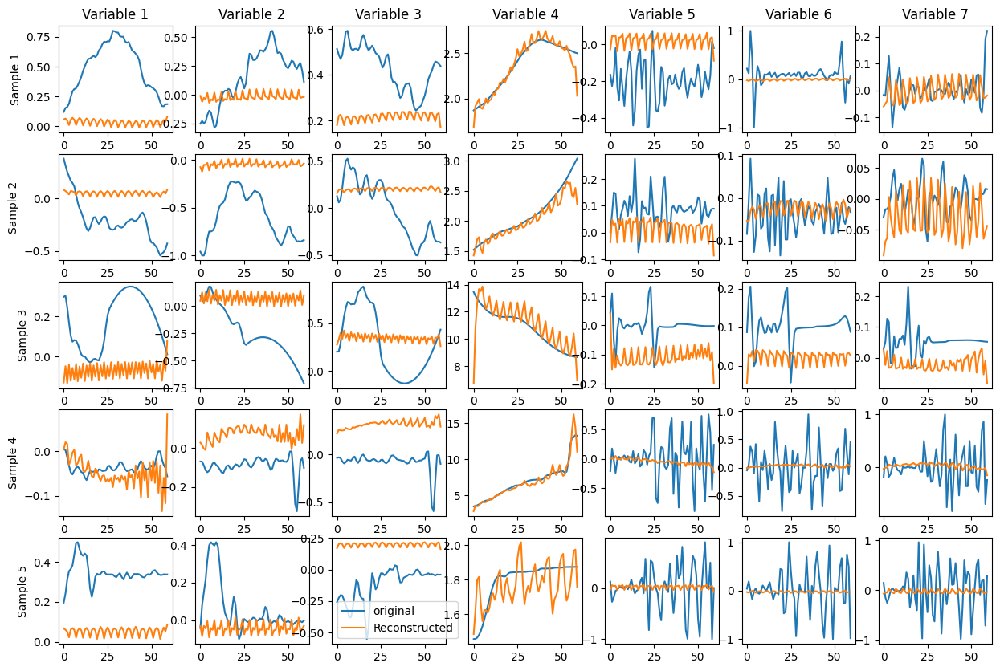

In [18]:
test_data = next(iter(dataloader))
reconstructed_data = model(test_data)

plot_reconstruction(test_data, reconstructed_data)